# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [9]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [10]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [11]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [12]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

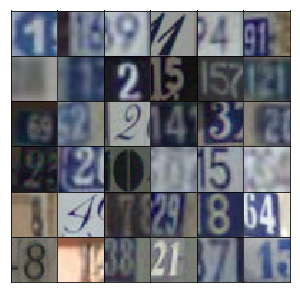

In [13]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [14]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [15]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [16]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [17]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        
        # Output layer, 32x32x3
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [28]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [19]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [21]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [22]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [23]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [25]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [31]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 10
alpha = 0.05
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/10... Discriminator Loss: 0.7397... Generator Loss: 1.1926
Epoch 1/10... Discriminator Loss: 0.1911... Generator Loss: 2.9024
Epoch 1/10... Discriminator Loss: 0.0711... Generator Loss: 3.6384
Epoch 1/10... Discriminator Loss: 0.0829... Generator Loss: 3.3650
Epoch 1/10... Discriminator Loss: 0.1298... Generator Loss: 2.7339
Epoch 1/10... Discriminator Loss: 0.1218... Generator Loss: 2.7602
Epoch 1/10... Discriminator Loss: 0.0880... Generator Loss: 2.8615
Epoch 1/10... Discriminator Loss: 0.0571... Generator Loss: 5.0464
Epoch 1/10... Discriminator Loss: 0.0689... Generator Loss: 4.8540
Epoch 1/10... Discriminator Loss: 0.0521... Generator Loss: 4.3605


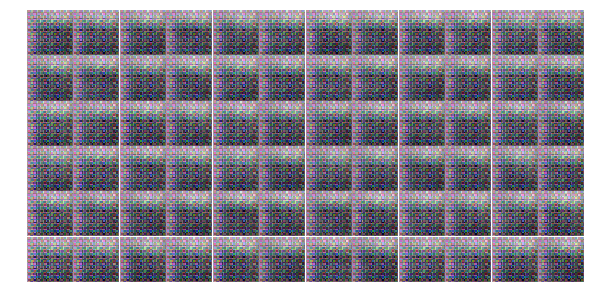

Epoch 1/10... Discriminator Loss: 0.0743... Generator Loss: 3.6921
Epoch 1/10... Discriminator Loss: 0.1701... Generator Loss: 2.3908
Epoch 1/10... Discriminator Loss: 0.0394... Generator Loss: 4.9434
Epoch 1/10... Discriminator Loss: 0.3337... Generator Loss: 1.7093
Epoch 1/10... Discriminator Loss: 0.7078... Generator Loss: 2.4954
Epoch 1/10... Discriminator Loss: 0.5809... Generator Loss: 1.5926
Epoch 1/10... Discriminator Loss: 0.4738... Generator Loss: 1.8333
Epoch 1/10... Discriminator Loss: 0.4177... Generator Loss: 1.7227
Epoch 1/10... Discriminator Loss: 0.8604... Generator Loss: 0.7793
Epoch 1/10... Discriminator Loss: 0.7188... Generator Loss: 3.5996


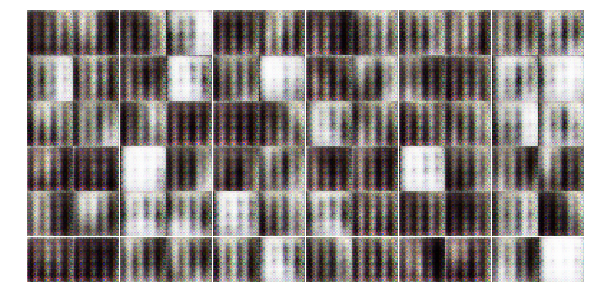

Epoch 1/10... Discriminator Loss: 0.2616... Generator Loss: 2.5685
Epoch 1/10... Discriminator Loss: 0.1829... Generator Loss: 2.4186
Epoch 1/10... Discriminator Loss: 0.3339... Generator Loss: 2.3244
Epoch 1/10... Discriminator Loss: 0.2364... Generator Loss: 2.5308
Epoch 1/10... Discriminator Loss: 0.1967... Generator Loss: 3.0888
Epoch 1/10... Discriminator Loss: 0.2082... Generator Loss: 2.3162
Epoch 1/10... Discriminator Loss: 0.1005... Generator Loss: 3.1254
Epoch 1/10... Discriminator Loss: 0.9291... Generator Loss: 0.9668
Epoch 1/10... Discriminator Loss: 0.6276... Generator Loss: 1.6631
Epoch 1/10... Discriminator Loss: 0.3629... Generator Loss: 1.7934


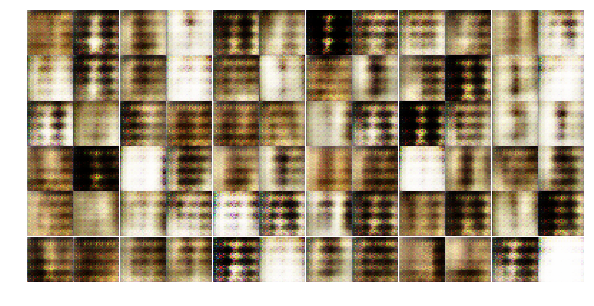

Epoch 1/10... Discriminator Loss: 0.5238... Generator Loss: 1.7576
Epoch 1/10... Discriminator Loss: 0.5005... Generator Loss: 1.6293
Epoch 1/10... Discriminator Loss: 0.4090... Generator Loss: 2.2144
Epoch 1/10... Discriminator Loss: 1.6210... Generator Loss: 0.3592
Epoch 1/10... Discriminator Loss: 0.5679... Generator Loss: 2.0950
Epoch 1/10... Discriminator Loss: 0.5005... Generator Loss: 1.5267
Epoch 1/10... Discriminator Loss: 0.4802... Generator Loss: 1.5904
Epoch 1/10... Discriminator Loss: 0.4724... Generator Loss: 1.3777
Epoch 1/10... Discriminator Loss: 0.6472... Generator Loss: 4.5425
Epoch 1/10... Discriminator Loss: 0.2369... Generator Loss: 3.2148


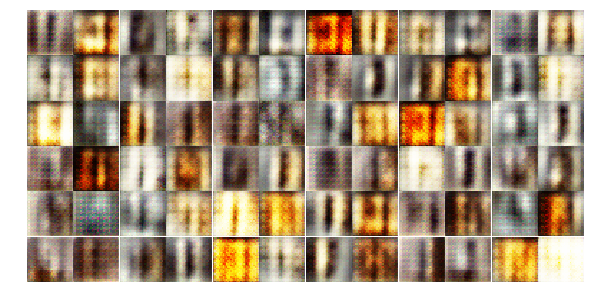

Epoch 1/10... Discriminator Loss: 0.2688... Generator Loss: 3.3996
Epoch 1/10... Discriminator Loss: 0.6240... Generator Loss: 1.1582
Epoch 1/10... Discriminator Loss: 0.3360... Generator Loss: 1.8268
Epoch 1/10... Discriminator Loss: 0.4542... Generator Loss: 1.8038
Epoch 1/10... Discriminator Loss: 0.3530... Generator Loss: 1.8030
Epoch 1/10... Discriminator Loss: 0.6609... Generator Loss: 1.1408
Epoch 1/10... Discriminator Loss: 1.3208... Generator Loss: 2.4443
Epoch 1/10... Discriminator Loss: 0.5479... Generator Loss: 2.1329
Epoch 1/10... Discriminator Loss: 0.3004... Generator Loss: 2.2507
Epoch 1/10... Discriminator Loss: 1.3644... Generator Loss: 0.4467


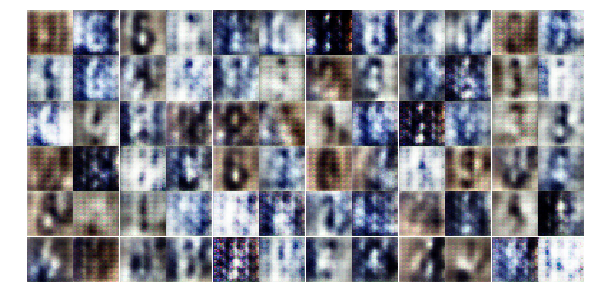

Epoch 1/10... Discriminator Loss: 0.6833... Generator Loss: 2.2377
Epoch 1/10... Discriminator Loss: 0.3753... Generator Loss: 2.2795
Epoch 1/10... Discriminator Loss: 0.5257... Generator Loss: 1.7752
Epoch 1/10... Discriminator Loss: 0.4579... Generator Loss: 1.7229
Epoch 1/10... Discriminator Loss: 0.5678... Generator Loss: 2.7681
Epoch 1/10... Discriminator Loss: 0.3266... Generator Loss: 1.7916
Epoch 1/10... Discriminator Loss: 0.3105... Generator Loss: 2.3419
Epoch 2/10... Discriminator Loss: 0.4991... Generator Loss: 1.8760
Epoch 2/10... Discriminator Loss: 0.2327... Generator Loss: 4.6154
Epoch 2/10... Discriminator Loss: 1.2136... Generator Loss: 0.9467


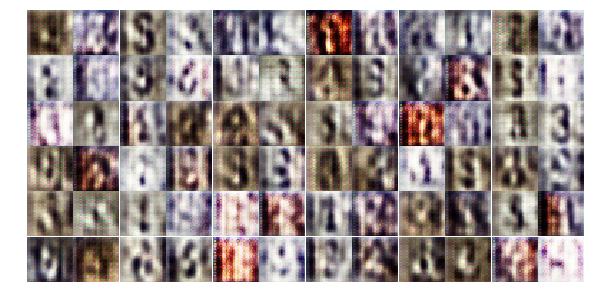

Epoch 2/10... Discriminator Loss: 0.5186... Generator Loss: 1.6581
Epoch 2/10... Discriminator Loss: 0.5274... Generator Loss: 2.3993
Epoch 2/10... Discriminator Loss: 1.0407... Generator Loss: 0.6286
Epoch 2/10... Discriminator Loss: 0.1840... Generator Loss: 3.0440
Epoch 2/10... Discriminator Loss: 0.2327... Generator Loss: 2.6436
Epoch 2/10... Discriminator Loss: 1.0586... Generator Loss: 0.6688
Epoch 2/10... Discriminator Loss: 0.6838... Generator Loss: 2.1797
Epoch 2/10... Discriminator Loss: 0.5840... Generator Loss: 1.5274
Epoch 2/10... Discriminator Loss: 0.3026... Generator Loss: 2.3139
Epoch 2/10... Discriminator Loss: 0.7128... Generator Loss: 0.9840


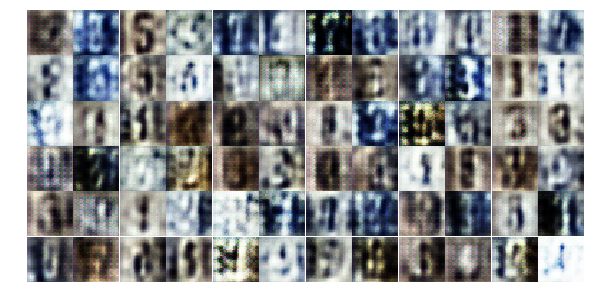

Epoch 2/10... Discriminator Loss: 0.4217... Generator Loss: 1.6157
Epoch 2/10... Discriminator Loss: 1.1366... Generator Loss: 4.5545
Epoch 2/10... Discriminator Loss: 0.6217... Generator Loss: 2.0071
Epoch 2/10... Discriminator Loss: 0.4538... Generator Loss: 1.4014
Epoch 2/10... Discriminator Loss: 1.5607... Generator Loss: 2.9759
Epoch 2/10... Discriminator Loss: 1.1498... Generator Loss: 0.8657
Epoch 2/10... Discriminator Loss: 0.4748... Generator Loss: 2.0739
Epoch 2/10... Discriminator Loss: 1.1706... Generator Loss: 0.5877
Epoch 2/10... Discriminator Loss: 0.7518... Generator Loss: 1.4175
Epoch 2/10... Discriminator Loss: 1.3015... Generator Loss: 0.4408


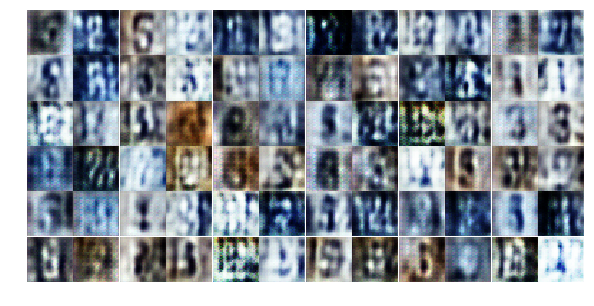

Epoch 2/10... Discriminator Loss: 0.7941... Generator Loss: 1.0492
Epoch 2/10... Discriminator Loss: 0.6852... Generator Loss: 1.9629
Epoch 2/10... Discriminator Loss: 0.8856... Generator Loss: 1.1961
Epoch 2/10... Discriminator Loss: 1.6352... Generator Loss: 0.3793
Epoch 2/10... Discriminator Loss: 0.5020... Generator Loss: 1.9354
Epoch 2/10... Discriminator Loss: 0.4570... Generator Loss: 2.0554
Epoch 2/10... Discriminator Loss: 0.2565... Generator Loss: 2.6879
Epoch 2/10... Discriminator Loss: 0.5423... Generator Loss: 1.6104
Epoch 2/10... Discriminator Loss: 1.0792... Generator Loss: 0.6408
Epoch 2/10... Discriminator Loss: 0.2097... Generator Loss: 5.2904


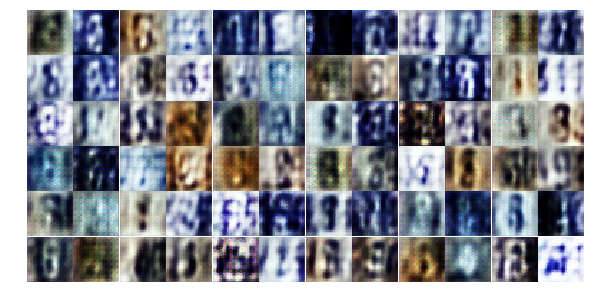

Epoch 2/10... Discriminator Loss: 0.7905... Generator Loss: 1.1302
Epoch 2/10... Discriminator Loss: 0.3618... Generator Loss: 1.8109
Epoch 2/10... Discriminator Loss: 0.4860... Generator Loss: 2.4709
Epoch 2/10... Discriminator Loss: 0.1156... Generator Loss: 3.0801
Epoch 2/10... Discriminator Loss: 0.3860... Generator Loss: 1.6796
Epoch 2/10... Discriminator Loss: 0.7865... Generator Loss: 0.9200
Epoch 2/10... Discriminator Loss: 1.4781... Generator Loss: 2.2685
Epoch 2/10... Discriminator Loss: 0.6119... Generator Loss: 1.1674
Epoch 2/10... Discriminator Loss: 0.7943... Generator Loss: 0.8265
Epoch 2/10... Discriminator Loss: 0.2062... Generator Loss: 3.9449


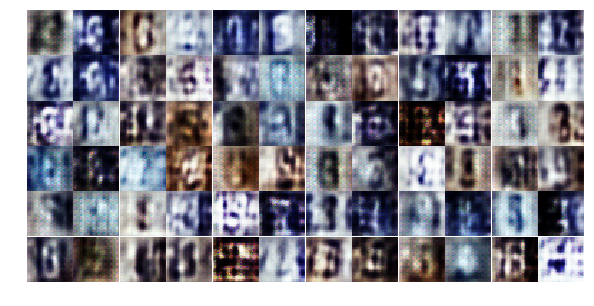

Epoch 2/10... Discriminator Loss: 0.2936... Generator Loss: 1.8394
Epoch 2/10... Discriminator Loss: 0.6911... Generator Loss: 0.9920
Epoch 2/10... Discriminator Loss: 0.6328... Generator Loss: 1.0911
Epoch 2/10... Discriminator Loss: 0.5424... Generator Loss: 4.2346
Epoch 2/10... Discriminator Loss: 0.4756... Generator Loss: 1.5014
Epoch 2/10... Discriminator Loss: 0.1913... Generator Loss: 4.0707
Epoch 2/10... Discriminator Loss: 0.0706... Generator Loss: 4.4701
Epoch 2/10... Discriminator Loss: 0.9032... Generator Loss: 0.7647
Epoch 2/10... Discriminator Loss: 1.5687... Generator Loss: 3.3777
Epoch 2/10... Discriminator Loss: 0.7715... Generator Loss: 0.8528


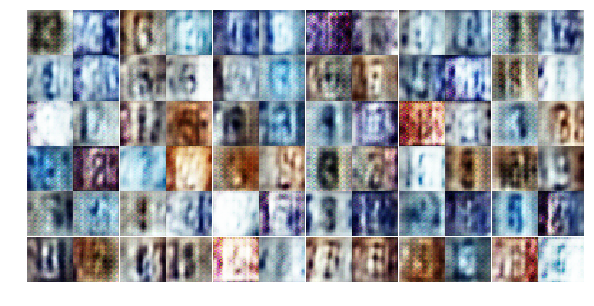

Epoch 2/10... Discriminator Loss: 0.6182... Generator Loss: 1.7081
Epoch 2/10... Discriminator Loss: 0.4797... Generator Loss: 2.1392
Epoch 2/10... Discriminator Loss: 0.3171... Generator Loss: 2.4747
Epoch 2/10... Discriminator Loss: 0.3660... Generator Loss: 1.7579
Epoch 3/10... Discriminator Loss: 0.7342... Generator Loss: 0.9372
Epoch 3/10... Discriminator Loss: 0.1817... Generator Loss: 4.7485
Epoch 3/10... Discriminator Loss: 1.1335... Generator Loss: 0.5413
Epoch 3/10... Discriminator Loss: 0.1786... Generator Loss: 2.3690
Epoch 3/10... Discriminator Loss: 0.5538... Generator Loss: 1.7276
Epoch 3/10... Discriminator Loss: 1.3116... Generator Loss: 1.3265


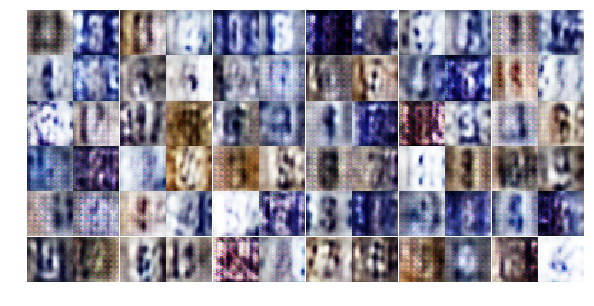

Epoch 3/10... Discriminator Loss: 1.4054... Generator Loss: 0.4993
Epoch 3/10... Discriminator Loss: 0.3410... Generator Loss: 2.2778
Epoch 3/10... Discriminator Loss: 0.5493... Generator Loss: 1.2418
Epoch 3/10... Discriminator Loss: 0.1943... Generator Loss: 2.6768
Epoch 3/10... Discriminator Loss: 0.4707... Generator Loss: 1.3864
Epoch 3/10... Discriminator Loss: 0.2786... Generator Loss: 2.0558
Epoch 3/10... Discriminator Loss: 0.8745... Generator Loss: 0.9857
Epoch 3/10... Discriminator Loss: 0.5492... Generator Loss: 2.7427
Epoch 3/10... Discriminator Loss: 0.7101... Generator Loss: 2.5013
Epoch 3/10... Discriminator Loss: 1.0965... Generator Loss: 0.6602


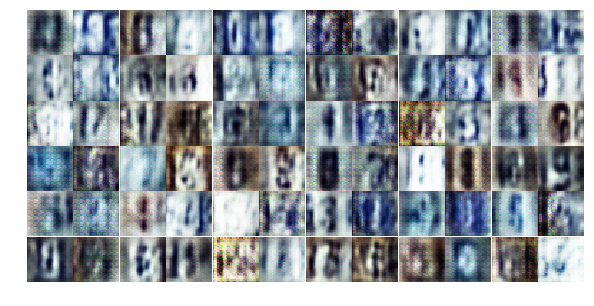

Epoch 3/10... Discriminator Loss: 0.5010... Generator Loss: 1.4873
Epoch 3/10... Discriminator Loss: 0.1787... Generator Loss: 2.8877
Epoch 3/10... Discriminator Loss: 0.2114... Generator Loss: 2.1537
Epoch 3/10... Discriminator Loss: 0.2924... Generator Loss: 3.2422
Epoch 3/10... Discriminator Loss: 0.6893... Generator Loss: 0.9331
Epoch 3/10... Discriminator Loss: 0.3168... Generator Loss: 4.2466
Epoch 3/10... Discriminator Loss: 0.6468... Generator Loss: 1.1111
Epoch 3/10... Discriminator Loss: 0.5216... Generator Loss: 1.2439
Epoch 3/10... Discriminator Loss: 0.1529... Generator Loss: 2.5802
Epoch 3/10... Discriminator Loss: 0.2002... Generator Loss: 2.5665


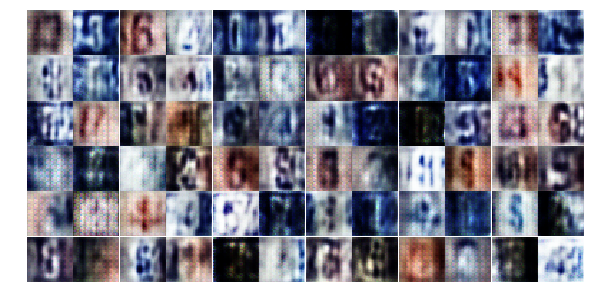

Epoch 3/10... Discriminator Loss: 1.0865... Generator Loss: 0.9449
Epoch 3/10... Discriminator Loss: 1.6091... Generator Loss: 0.3689
Epoch 3/10... Discriminator Loss: 0.3769... Generator Loss: 2.3048
Epoch 3/10... Discriminator Loss: 0.3110... Generator Loss: 2.8297
Epoch 3/10... Discriminator Loss: 1.2019... Generator Loss: 0.5305
Epoch 3/10... Discriminator Loss: 0.5749... Generator Loss: 1.2815
Epoch 3/10... Discriminator Loss: 0.9745... Generator Loss: 0.7269
Epoch 3/10... Discriminator Loss: 1.3183... Generator Loss: 0.4166
Epoch 3/10... Discriminator Loss: 0.3566... Generator Loss: 1.9474
Epoch 3/10... Discriminator Loss: 1.0226... Generator Loss: 0.7252


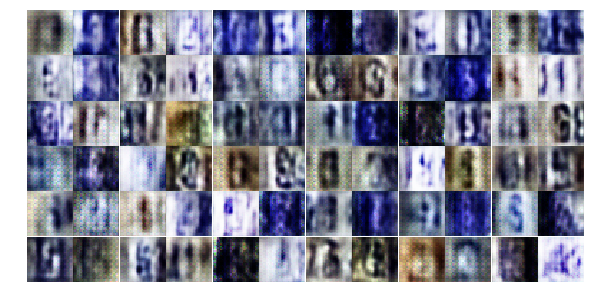

Epoch 3/10... Discriminator Loss: 1.5370... Generator Loss: 0.3662
Epoch 3/10... Discriminator Loss: 0.4759... Generator Loss: 1.6651
Epoch 3/10... Discriminator Loss: 0.1628... Generator Loss: 2.6254
Epoch 3/10... Discriminator Loss: 0.9557... Generator Loss: 3.3772
Epoch 3/10... Discriminator Loss: 1.1585... Generator Loss: 0.5470
Epoch 3/10... Discriminator Loss: 0.2108... Generator Loss: 2.3973
Epoch 3/10... Discriminator Loss: 0.4846... Generator Loss: 1.5508
Epoch 3/10... Discriminator Loss: 1.0359... Generator Loss: 1.0492
Epoch 3/10... Discriminator Loss: 0.4067... Generator Loss: 1.5102
Epoch 3/10... Discriminator Loss: 0.2517... Generator Loss: 2.3990


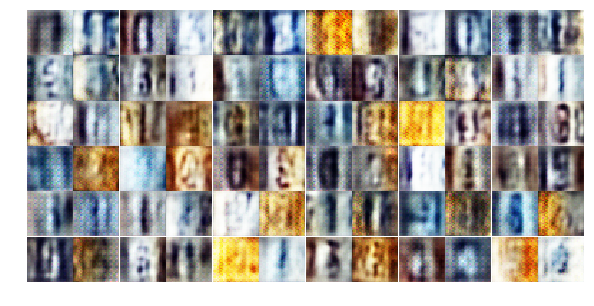

Epoch 3/10... Discriminator Loss: 2.4122... Generator Loss: 4.5531
Epoch 3/10... Discriminator Loss: 0.3532... Generator Loss: 3.2458
Epoch 3/10... Discriminator Loss: 0.7466... Generator Loss: 0.9676
Epoch 3/10... Discriminator Loss: 0.5682... Generator Loss: 1.1971
Epoch 3/10... Discriminator Loss: 0.3063... Generator Loss: 2.3504
Epoch 3/10... Discriminator Loss: 0.8493... Generator Loss: 1.1713
Epoch 3/10... Discriminator Loss: 1.1183... Generator Loss: 0.7510
Epoch 3/10... Discriminator Loss: 1.2735... Generator Loss: 0.5248
Epoch 3/10... Discriminator Loss: 0.8058... Generator Loss: 1.6486
Epoch 3/10... Discriminator Loss: 0.7525... Generator Loss: 0.8786


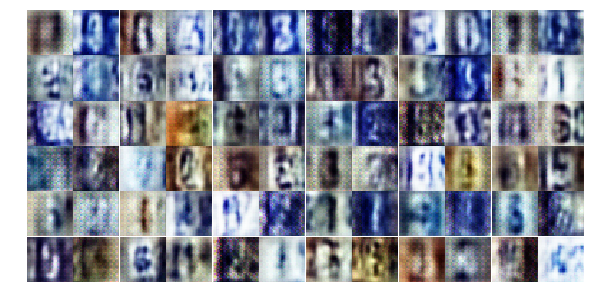

Epoch 3/10... Discriminator Loss: 0.8038... Generator Loss: 2.1799
Epoch 4/10... Discriminator Loss: 0.8020... Generator Loss: 1.0376
Epoch 4/10... Discriminator Loss: 0.4738... Generator Loss: 1.7538
Epoch 4/10... Discriminator Loss: 1.7863... Generator Loss: 3.0029
Epoch 4/10... Discriminator Loss: 1.0300... Generator Loss: 0.6361
Epoch 4/10... Discriminator Loss: 0.2892... Generator Loss: 2.1473
Epoch 4/10... Discriminator Loss: 0.4495... Generator Loss: 3.7538
Epoch 4/10... Discriminator Loss: 1.8189... Generator Loss: 0.2735
Epoch 4/10... Discriminator Loss: 0.5238... Generator Loss: 1.7302
Epoch 4/10... Discriminator Loss: 0.3135... Generator Loss: 2.2062


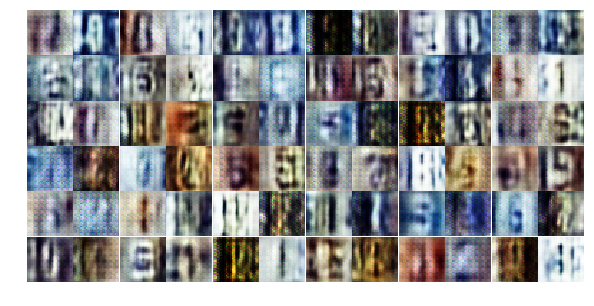

Epoch 4/10... Discriminator Loss: 0.3667... Generator Loss: 1.7526
Epoch 4/10... Discriminator Loss: 0.4689... Generator Loss: 1.7988
Epoch 4/10... Discriminator Loss: 1.2610... Generator Loss: 0.8034
Epoch 4/10... Discriminator Loss: 0.3905... Generator Loss: 1.5282
Epoch 4/10... Discriminator Loss: 0.7675... Generator Loss: 1.4509
Epoch 4/10... Discriminator Loss: 0.6577... Generator Loss: 1.1928
Epoch 4/10... Discriminator Loss: 0.7422... Generator Loss: 1.2850
Epoch 4/10... Discriminator Loss: 0.3198... Generator Loss: 2.5191
Epoch 4/10... Discriminator Loss: 0.8330... Generator Loss: 1.8093
Epoch 4/10... Discriminator Loss: 0.2974... Generator Loss: 3.1017


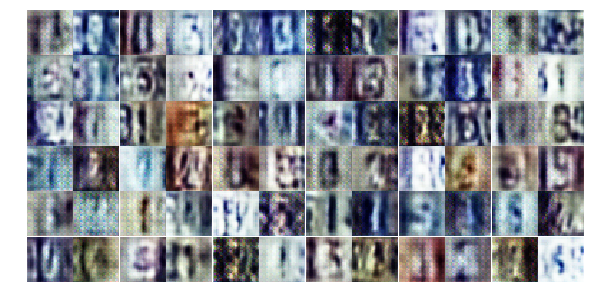

Epoch 4/10... Discriminator Loss: 0.7832... Generator Loss: 1.3245
Epoch 4/10... Discriminator Loss: 0.9821... Generator Loss: 0.6311
Epoch 4/10... Discriminator Loss: 0.4873... Generator Loss: 1.3138
Epoch 4/10... Discriminator Loss: 0.1823... Generator Loss: 3.0789
Epoch 4/10... Discriminator Loss: 0.6762... Generator Loss: 1.6294
Epoch 4/10... Discriminator Loss: 0.5153... Generator Loss: 1.2116
Epoch 4/10... Discriminator Loss: 0.4460... Generator Loss: 1.6750
Epoch 4/10... Discriminator Loss: 0.8305... Generator Loss: 1.2684
Epoch 4/10... Discriminator Loss: 1.3029... Generator Loss: 0.4699
Epoch 4/10... Discriminator Loss: 0.5744... Generator Loss: 1.3747


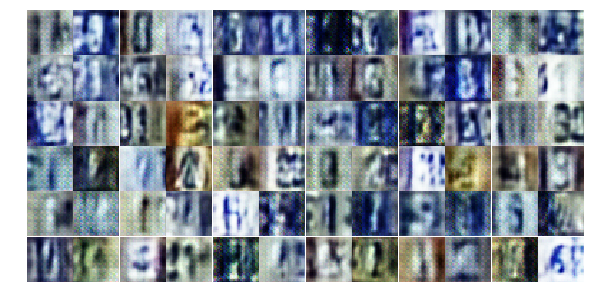

Epoch 4/10... Discriminator Loss: 0.3647... Generator Loss: 1.8881
Epoch 4/10... Discriminator Loss: 0.2858... Generator Loss: 3.3100
Epoch 4/10... Discriminator Loss: 0.4641... Generator Loss: 1.4288
Epoch 4/10... Discriminator Loss: 0.8894... Generator Loss: 0.8086
Epoch 4/10... Discriminator Loss: 0.7385... Generator Loss: 1.6179
Epoch 4/10... Discriminator Loss: 0.8328... Generator Loss: 0.7996
Epoch 4/10... Discriminator Loss: 0.7662... Generator Loss: 1.2372
Epoch 4/10... Discriminator Loss: 0.6327... Generator Loss: 1.6864
Epoch 4/10... Discriminator Loss: 0.7053... Generator Loss: 1.7401
Epoch 4/10... Discriminator Loss: 0.4588... Generator Loss: 1.5922


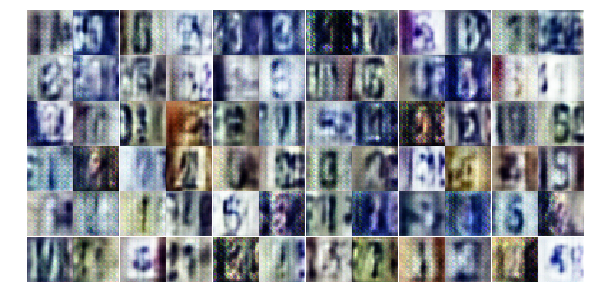

Epoch 4/10... Discriminator Loss: 0.2152... Generator Loss: 3.0179
Epoch 4/10... Discriminator Loss: 0.4873... Generator Loss: 1.2411
Epoch 4/10... Discriminator Loss: 0.7030... Generator Loss: 1.3311
Epoch 4/10... Discriminator Loss: 0.1167... Generator Loss: 3.2624
Epoch 4/10... Discriminator Loss: 0.9308... Generator Loss: 2.1763
Epoch 4/10... Discriminator Loss: 1.5747... Generator Loss: 2.4674
Epoch 4/10... Discriminator Loss: 0.7478... Generator Loss: 0.9872
Epoch 4/10... Discriminator Loss: 0.6173... Generator Loss: 2.6253
Epoch 4/10... Discriminator Loss: 0.9125... Generator Loss: 0.7557
Epoch 4/10... Discriminator Loss: 0.3093... Generator Loss: 2.3231


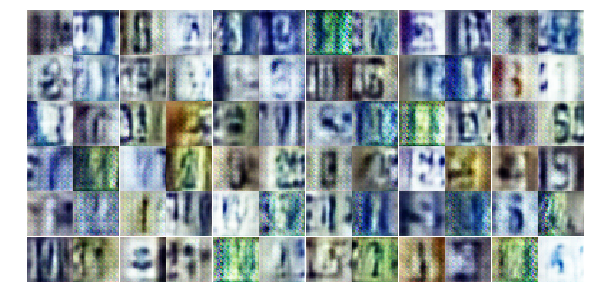

Epoch 4/10... Discriminator Loss: 0.3464... Generator Loss: 3.1062
Epoch 4/10... Discriminator Loss: 0.8070... Generator Loss: 1.4472
Epoch 4/10... Discriminator Loss: 0.1505... Generator Loss: 3.0477
Epoch 4/10... Discriminator Loss: 0.4838... Generator Loss: 1.9055
Epoch 4/10... Discriminator Loss: 0.5586... Generator Loss: 1.1950
Epoch 4/10... Discriminator Loss: 1.3182... Generator Loss: 2.8698
Epoch 4/10... Discriminator Loss: 0.3745... Generator Loss: 1.6530
Epoch 4/10... Discriminator Loss: 0.3670... Generator Loss: 3.0123
Epoch 4/10... Discriminator Loss: 0.5783... Generator Loss: 1.3644
Epoch 5/10... Discriminator Loss: 0.5549... Generator Loss: 1.3006


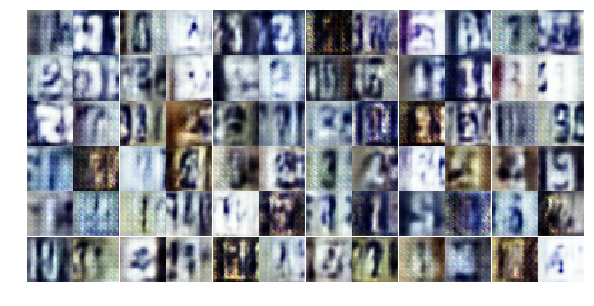

Epoch 5/10... Discriminator Loss: 1.0400... Generator Loss: 0.7717
Epoch 5/10... Discriminator Loss: 0.3803... Generator Loss: 1.6415
Epoch 5/10... Discriminator Loss: 0.8223... Generator Loss: 0.7816
Epoch 5/10... Discriminator Loss: 0.2488... Generator Loss: 1.9951
Epoch 5/10... Discriminator Loss: 1.5917... Generator Loss: 2.7811
Epoch 5/10... Discriminator Loss: 1.1580... Generator Loss: 0.5377
Epoch 5/10... Discriminator Loss: 0.4642... Generator Loss: 1.6502
Epoch 5/10... Discriminator Loss: 0.4245... Generator Loss: 1.5885
Epoch 5/10... Discriminator Loss: 0.5321... Generator Loss: 1.8249
Epoch 5/10... Discriminator Loss: 0.2710... Generator Loss: 2.0401


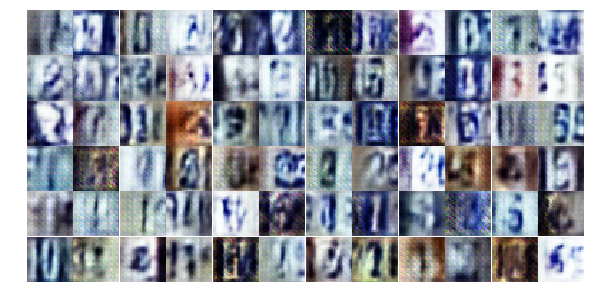

Epoch 5/10... Discriminator Loss: 1.3185... Generator Loss: 0.4382
Epoch 5/10... Discriminator Loss: 0.6735... Generator Loss: 1.5294
Epoch 5/10... Discriminator Loss: 0.3739... Generator Loss: 1.7830
Epoch 5/10... Discriminator Loss: 0.7231... Generator Loss: 0.9899
Epoch 5/10... Discriminator Loss: 0.9385... Generator Loss: 2.2031
Epoch 5/10... Discriminator Loss: 0.4851... Generator Loss: 2.1971
Epoch 5/10... Discriminator Loss: 0.1764... Generator Loss: 3.1803
Epoch 5/10... Discriminator Loss: 1.6945... Generator Loss: 2.8511
Epoch 5/10... Discriminator Loss: 0.5517... Generator Loss: 1.4425
Epoch 5/10... Discriminator Loss: 0.8856... Generator Loss: 2.5311


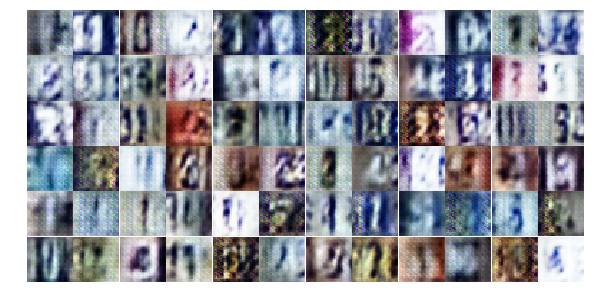

Epoch 5/10... Discriminator Loss: 0.3318... Generator Loss: 1.8159
Epoch 5/10... Discriminator Loss: 0.8468... Generator Loss: 1.7450
Epoch 5/10... Discriminator Loss: 0.3969... Generator Loss: 3.0365
Epoch 5/10... Discriminator Loss: 0.5403... Generator Loss: 1.7126
Epoch 5/10... Discriminator Loss: 1.5898... Generator Loss: 0.3026
Epoch 5/10... Discriminator Loss: 0.8561... Generator Loss: 0.9153
Epoch 5/10... Discriminator Loss: 1.5583... Generator Loss: 0.3300
Epoch 5/10... Discriminator Loss: 0.4146... Generator Loss: 2.1914
Epoch 5/10... Discriminator Loss: 0.5101... Generator Loss: 2.0237
Epoch 5/10... Discriminator Loss: 0.1731... Generator Loss: 3.4987


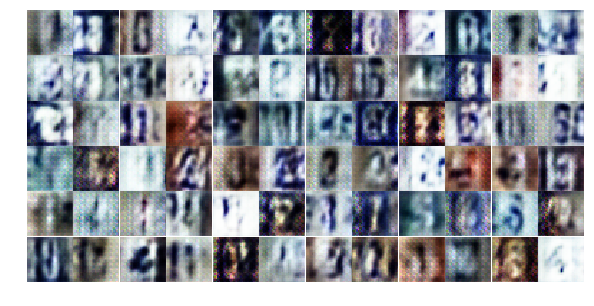

Epoch 5/10... Discriminator Loss: 2.9222... Generator Loss: 5.9687
Epoch 5/10... Discriminator Loss: 0.7582... Generator Loss: 1.1884
Epoch 5/10... Discriminator Loss: 0.3109... Generator Loss: 3.0644
Epoch 5/10... Discriminator Loss: 1.1176... Generator Loss: 0.5663
Epoch 5/10... Discriminator Loss: 0.8135... Generator Loss: 1.0511
Epoch 5/10... Discriminator Loss: 0.3371... Generator Loss: 2.7409
Epoch 5/10... Discriminator Loss: 0.4312... Generator Loss: 1.7317
Epoch 5/10... Discriminator Loss: 0.7676... Generator Loss: 1.7520
Epoch 5/10... Discriminator Loss: 0.9189... Generator Loss: 0.7364
Epoch 5/10... Discriminator Loss: 0.5218... Generator Loss: 1.4038


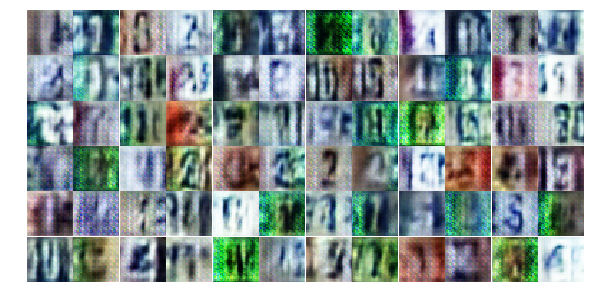

Epoch 5/10... Discriminator Loss: 0.6292... Generator Loss: 1.1586
Epoch 5/10... Discriminator Loss: 0.2902... Generator Loss: 2.1934
Epoch 5/10... Discriminator Loss: 1.7786... Generator Loss: 0.2856
Epoch 5/10... Discriminator Loss: 0.5991... Generator Loss: 1.3649
Epoch 5/10... Discriminator Loss: 0.7740... Generator Loss: 1.8095
Epoch 5/10... Discriminator Loss: 0.6111... Generator Loss: 1.1789
Epoch 5/10... Discriminator Loss: 0.6427... Generator Loss: 1.1576
Epoch 5/10... Discriminator Loss: 0.8709... Generator Loss: 1.8063
Epoch 5/10... Discriminator Loss: 0.6839... Generator Loss: 1.4243
Epoch 5/10... Discriminator Loss: 0.5536... Generator Loss: 1.7818


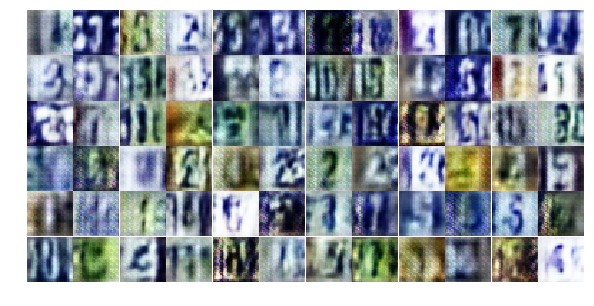

Epoch 5/10... Discriminator Loss: 0.8056... Generator Loss: 1.2190
Epoch 5/10... Discriminator Loss: 0.2456... Generator Loss: 2.6896
Epoch 5/10... Discriminator Loss: 1.2961... Generator Loss: 0.4455
Epoch 5/10... Discriminator Loss: 0.5199... Generator Loss: 1.3399
Epoch 5/10... Discriminator Loss: 0.6799... Generator Loss: 1.1692
Epoch 5/10... Discriminator Loss: 1.4642... Generator Loss: 0.3463
Epoch 6/10... Discriminator Loss: 0.6949... Generator Loss: 1.0159
Epoch 6/10... Discriminator Loss: 0.5794... Generator Loss: 1.3068
Epoch 6/10... Discriminator Loss: 0.2748... Generator Loss: 2.8520
Epoch 6/10... Discriminator Loss: 0.7199... Generator Loss: 0.9744


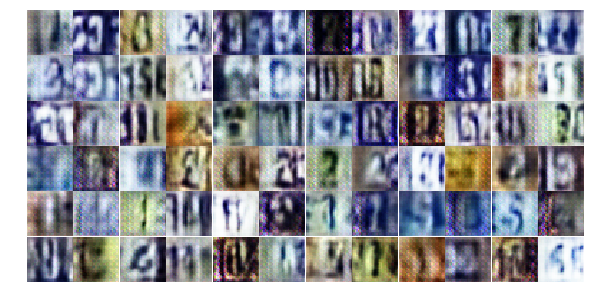

Epoch 6/10... Discriminator Loss: 0.4087... Generator Loss: 1.5203
Epoch 6/10... Discriminator Loss: 0.6139... Generator Loss: 1.9185
Epoch 6/10... Discriminator Loss: 0.7092... Generator Loss: 0.9426
Epoch 6/10... Discriminator Loss: 0.9510... Generator Loss: 0.6596
Epoch 6/10... Discriminator Loss: 0.3805... Generator Loss: 1.5729
Epoch 6/10... Discriminator Loss: 0.4110... Generator Loss: 2.1448
Epoch 6/10... Discriminator Loss: 1.1807... Generator Loss: 2.1992
Epoch 6/10... Discriminator Loss: 0.7914... Generator Loss: 1.5198
Epoch 6/10... Discriminator Loss: 0.9972... Generator Loss: 0.5841
Epoch 6/10... Discriminator Loss: 0.9162... Generator Loss: 2.4962


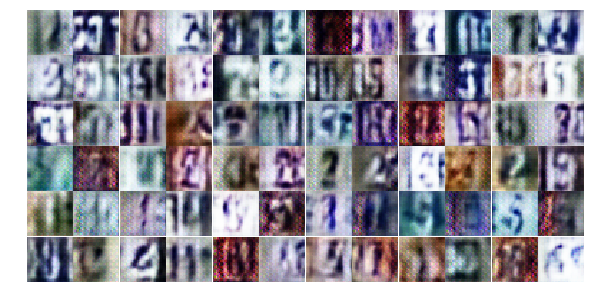

Epoch 6/10... Discriminator Loss: 0.8416... Generator Loss: 1.5208
Epoch 6/10... Discriminator Loss: 0.7051... Generator Loss: 1.3458
Epoch 6/10... Discriminator Loss: 1.5758... Generator Loss: 0.3037
Epoch 6/10... Discriminator Loss: 0.4765... Generator Loss: 1.3414
Epoch 6/10... Discriminator Loss: 0.4058... Generator Loss: 1.7495
Epoch 6/10... Discriminator Loss: 0.5810... Generator Loss: 1.7959
Epoch 6/10... Discriminator Loss: 0.4160... Generator Loss: 1.6638
Epoch 6/10... Discriminator Loss: 0.8248... Generator Loss: 0.8266
Epoch 6/10... Discriminator Loss: 0.5925... Generator Loss: 1.6147
Epoch 6/10... Discriminator Loss: 0.6341... Generator Loss: 1.4767


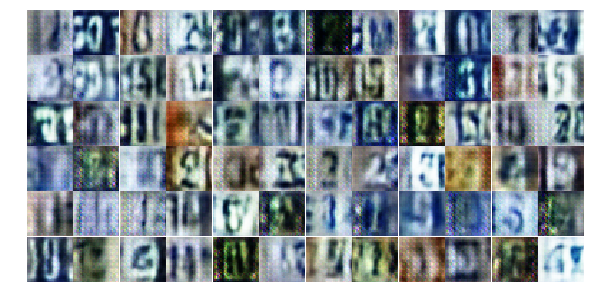

Epoch 6/10... Discriminator Loss: 0.6636... Generator Loss: 1.0034
Epoch 6/10... Discriminator Loss: 0.9016... Generator Loss: 0.6888
Epoch 6/10... Discriminator Loss: 0.8012... Generator Loss: 0.8535
Epoch 6/10... Discriminator Loss: 1.2288... Generator Loss: 4.2094
Epoch 6/10... Discriminator Loss: 0.5948... Generator Loss: 1.5178
Epoch 6/10... Discriminator Loss: 0.8069... Generator Loss: 0.9486
Epoch 6/10... Discriminator Loss: 0.5514... Generator Loss: 1.3567
Epoch 6/10... Discriminator Loss: 0.4346... Generator Loss: 1.3642
Epoch 6/10... Discriminator Loss: 0.7841... Generator Loss: 0.9176
Epoch 6/10... Discriminator Loss: 0.4983... Generator Loss: 1.4187


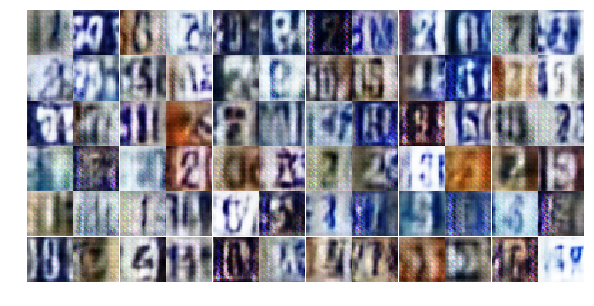

Epoch 6/10... Discriminator Loss: 1.4117... Generator Loss: 0.4081
Epoch 6/10... Discriminator Loss: 0.5280... Generator Loss: 1.4744
Epoch 6/10... Discriminator Loss: 1.5004... Generator Loss: 0.3403
Epoch 6/10... Discriminator Loss: 0.6861... Generator Loss: 0.9902
Epoch 6/10... Discriminator Loss: 0.6589... Generator Loss: 1.0956
Epoch 6/10... Discriminator Loss: 0.2833... Generator Loss: 2.5229
Epoch 6/10... Discriminator Loss: 0.2737... Generator Loss: 2.0539
Epoch 6/10... Discriminator Loss: 0.3615... Generator Loss: 2.0471
Epoch 6/10... Discriminator Loss: 0.2753... Generator Loss: 2.0775
Epoch 6/10... Discriminator Loss: 0.4757... Generator Loss: 1.2856


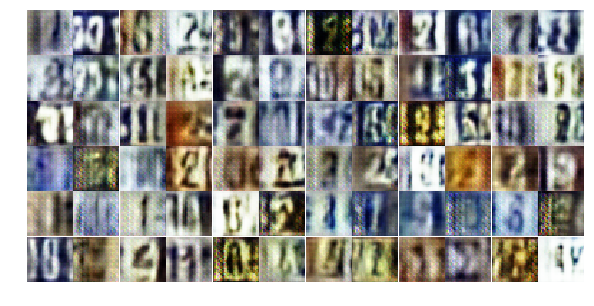

Epoch 6/10... Discriminator Loss: 0.6349... Generator Loss: 1.8957
Epoch 6/10... Discriminator Loss: 0.4307... Generator Loss: 1.5765
Epoch 6/10... Discriminator Loss: 0.4042... Generator Loss: 1.6888
Epoch 6/10... Discriminator Loss: 0.5990... Generator Loss: 3.0728
Epoch 6/10... Discriminator Loss: 0.5368... Generator Loss: 1.4690
Epoch 6/10... Discriminator Loss: 0.7144... Generator Loss: 1.0427
Epoch 6/10... Discriminator Loss: 0.7698... Generator Loss: 1.7866
Epoch 6/10... Discriminator Loss: 2.0795... Generator Loss: 0.2083
Epoch 6/10... Discriminator Loss: 0.7762... Generator Loss: 1.6744
Epoch 6/10... Discriminator Loss: 1.0114... Generator Loss: 0.6833


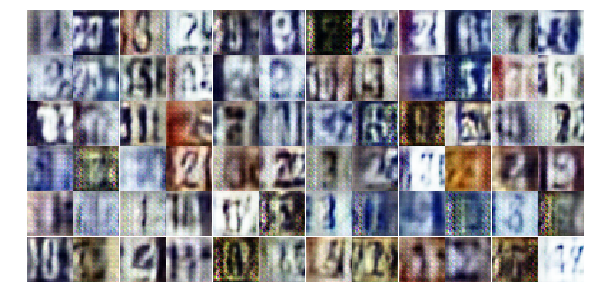

Epoch 6/10... Discriminator Loss: 0.4904... Generator Loss: 1.4506
Epoch 6/10... Discriminator Loss: 0.5820... Generator Loss: 1.2304
Epoch 6/10... Discriminator Loss: 0.5776... Generator Loss: 1.2712
Epoch 7/10... Discriminator Loss: 0.5170... Generator Loss: 1.4109
Epoch 7/10... Discriminator Loss: 0.5604... Generator Loss: 1.3362
Epoch 7/10... Discriminator Loss: 0.7289... Generator Loss: 0.9314
Epoch 7/10... Discriminator Loss: 0.8841... Generator Loss: 0.7079
Epoch 7/10... Discriminator Loss: 0.6799... Generator Loss: 1.7015
Epoch 7/10... Discriminator Loss: 0.5750... Generator Loss: 1.3587
Epoch 7/10... Discriminator Loss: 0.4816... Generator Loss: 1.3331


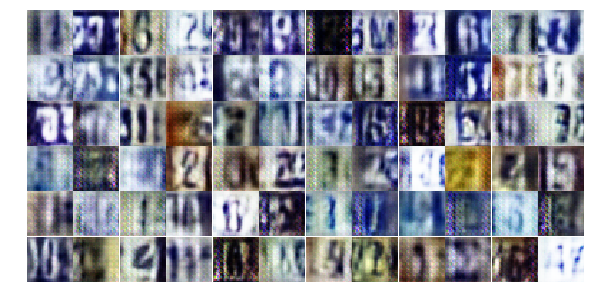

Epoch 7/10... Discriminator Loss: 0.9042... Generator Loss: 0.9578
Epoch 7/10... Discriminator Loss: 0.4296... Generator Loss: 1.4722
Epoch 7/10... Discriminator Loss: 0.4575... Generator Loss: 1.2623
Epoch 7/10... Discriminator Loss: 0.4601... Generator Loss: 1.5254
Epoch 7/10... Discriminator Loss: 0.4491... Generator Loss: 1.7094
Epoch 7/10... Discriminator Loss: 0.7739... Generator Loss: 0.9210
Epoch 7/10... Discriminator Loss: 0.7238... Generator Loss: 1.5851
Epoch 7/10... Discriminator Loss: 0.7708... Generator Loss: 1.8687
Epoch 7/10... Discriminator Loss: 1.1115... Generator Loss: 2.6304
Epoch 7/10... Discriminator Loss: 0.6810... Generator Loss: 1.0056


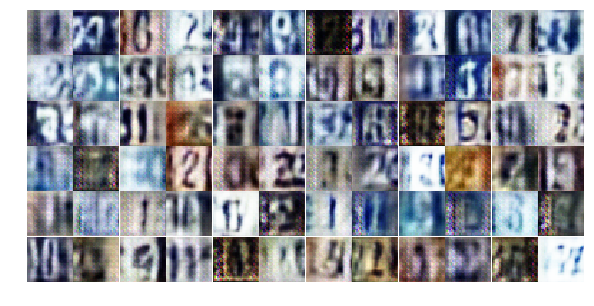

Epoch 7/10... Discriminator Loss: 0.4738... Generator Loss: 1.4236
Epoch 7/10... Discriminator Loss: 1.1657... Generator Loss: 0.4657
Epoch 7/10... Discriminator Loss: 0.6411... Generator Loss: 1.3100
Epoch 7/10... Discriminator Loss: 0.7481... Generator Loss: 0.9535
Epoch 7/10... Discriminator Loss: 0.4895... Generator Loss: 1.7764
Epoch 7/10... Discriminator Loss: 0.5923... Generator Loss: 1.2042
Epoch 7/10... Discriminator Loss: 0.5203... Generator Loss: 1.3140
Epoch 7/10... Discriminator Loss: 0.8894... Generator Loss: 0.8566
Epoch 7/10... Discriminator Loss: 0.3680... Generator Loss: 1.7097
Epoch 7/10... Discriminator Loss: 0.3631... Generator Loss: 2.1193


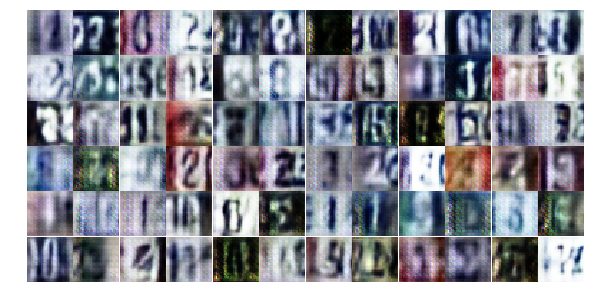

Epoch 7/10... Discriminator Loss: 0.8423... Generator Loss: 0.7672
Epoch 7/10... Discriminator Loss: 1.3808... Generator Loss: 0.3817
Epoch 7/10... Discriminator Loss: 0.2817... Generator Loss: 2.0125
Epoch 7/10... Discriminator Loss: 0.4917... Generator Loss: 1.4956
Epoch 7/10... Discriminator Loss: 1.2466... Generator Loss: 0.4560
Epoch 7/10... Discriminator Loss: 0.5102... Generator Loss: 1.4558
Epoch 7/10... Discriminator Loss: 0.3599... Generator Loss: 1.6131
Epoch 7/10... Discriminator Loss: 0.6277... Generator Loss: 1.1825
Epoch 7/10... Discriminator Loss: 0.7710... Generator Loss: 2.1176
Epoch 7/10... Discriminator Loss: 0.4089... Generator Loss: 2.8273


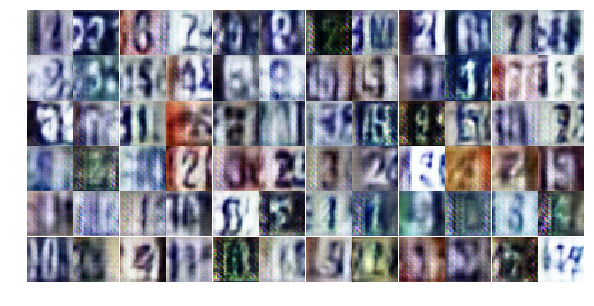

Epoch 7/10... Discriminator Loss: 0.8328... Generator Loss: 1.0931
Epoch 7/10... Discriminator Loss: 0.7830... Generator Loss: 1.1300
Epoch 7/10... Discriminator Loss: 0.4721... Generator Loss: 1.4461
Epoch 7/10... Discriminator Loss: 0.6684... Generator Loss: 1.2917
Epoch 7/10... Discriminator Loss: 0.4561... Generator Loss: 1.3075
Epoch 7/10... Discriminator Loss: 0.3036... Generator Loss: 2.0022
Epoch 7/10... Discriminator Loss: 0.5197... Generator Loss: 1.1667
Epoch 7/10... Discriminator Loss: 0.9173... Generator Loss: 0.7124
Epoch 7/10... Discriminator Loss: 0.4005... Generator Loss: 1.4458
Epoch 7/10... Discriminator Loss: 0.8022... Generator Loss: 1.0073


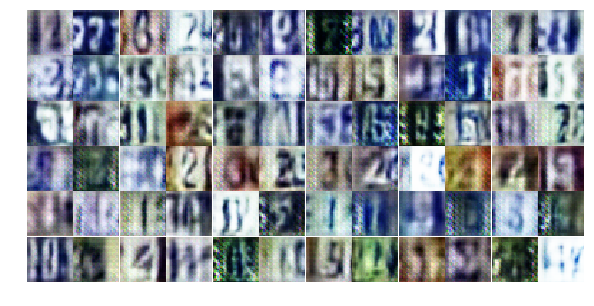

Epoch 7/10... Discriminator Loss: 0.6495... Generator Loss: 2.3521
Epoch 7/10... Discriminator Loss: 0.6685... Generator Loss: 0.9929
Epoch 7/10... Discriminator Loss: 0.6373... Generator Loss: 1.0707
Epoch 7/10... Discriminator Loss: 0.5472... Generator Loss: 1.6359
Epoch 7/10... Discriminator Loss: 0.5612... Generator Loss: 1.2241
Epoch 7/10... Discriminator Loss: 1.0794... Generator Loss: 0.6331
Epoch 7/10... Discriminator Loss: 1.4815... Generator Loss: 0.3674
Epoch 7/10... Discriminator Loss: 0.8158... Generator Loss: 0.9005
Epoch 7/10... Discriminator Loss: 0.8871... Generator Loss: 0.8743
Epoch 7/10... Discriminator Loss: 0.2535... Generator Loss: 2.1838


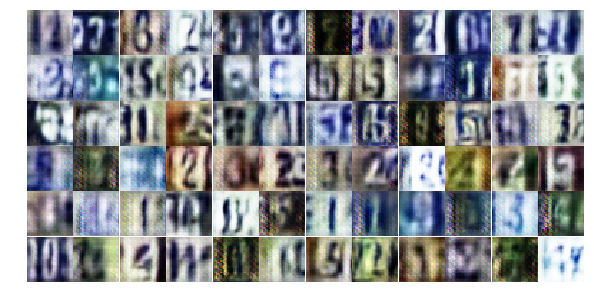

Epoch 7/10... Discriminator Loss: 0.4545... Generator Loss: 1.7326
Epoch 8/10... Discriminator Loss: 0.9828... Generator Loss: 0.6746
Epoch 8/10... Discriminator Loss: 0.3196... Generator Loss: 1.9583
Epoch 8/10... Discriminator Loss: 0.3733... Generator Loss: 2.1212
Epoch 8/10... Discriminator Loss: 0.4169... Generator Loss: 1.9879
Epoch 8/10... Discriminator Loss: 1.0406... Generator Loss: 0.6769
Epoch 8/10... Discriminator Loss: 0.7482... Generator Loss: 0.8528
Epoch 8/10... Discriminator Loss: 0.5599... Generator Loss: 1.3029
Epoch 8/10... Discriminator Loss: 0.9091... Generator Loss: 1.1886
Epoch 8/10... Discriminator Loss: 0.6502... Generator Loss: 1.1913


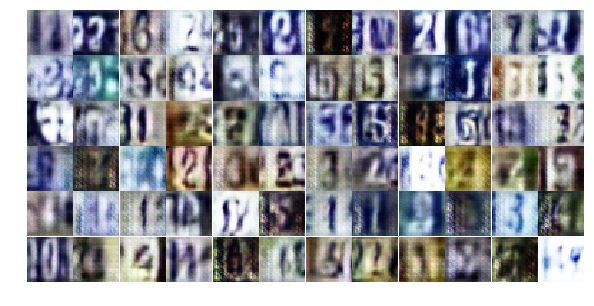

Epoch 8/10... Discriminator Loss: 0.4135... Generator Loss: 2.0739
Epoch 8/10... Discriminator Loss: 0.6446... Generator Loss: 1.0535
Epoch 8/10... Discriminator Loss: 0.5563... Generator Loss: 1.1964
Epoch 8/10... Discriminator Loss: 0.4201... Generator Loss: 1.4829
Epoch 8/10... Discriminator Loss: 1.5214... Generator Loss: 0.3833
Epoch 8/10... Discriminator Loss: 0.7113... Generator Loss: 1.0609
Epoch 8/10... Discriminator Loss: 0.5369... Generator Loss: 1.3076
Epoch 8/10... Discriminator Loss: 1.0392... Generator Loss: 0.6911
Epoch 8/10... Discriminator Loss: 0.6274... Generator Loss: 1.3959
Epoch 8/10... Discriminator Loss: 0.6295... Generator Loss: 1.2226


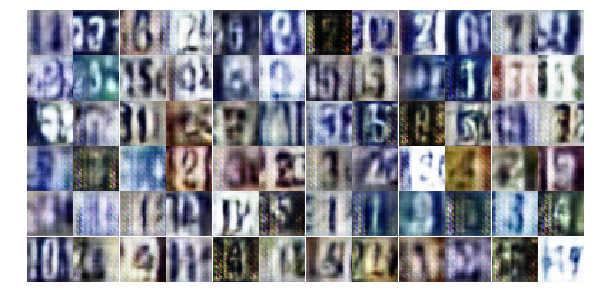

Epoch 8/10... Discriminator Loss: 0.2704... Generator Loss: 2.1389
Epoch 8/10... Discriminator Loss: 0.8316... Generator Loss: 0.8746
Epoch 8/10... Discriminator Loss: 0.7069... Generator Loss: 1.0203
Epoch 8/10... Discriminator Loss: 0.6523... Generator Loss: 1.7393
Epoch 8/10... Discriminator Loss: 0.2743... Generator Loss: 2.1904
Epoch 8/10... Discriminator Loss: 0.5211... Generator Loss: 1.2530
Epoch 8/10... Discriminator Loss: 1.2302... Generator Loss: 2.0832
Epoch 8/10... Discriminator Loss: 1.2982... Generator Loss: 0.4487
Epoch 8/10... Discriminator Loss: 0.6667... Generator Loss: 1.7705
Epoch 8/10... Discriminator Loss: 0.6561... Generator Loss: 1.0791


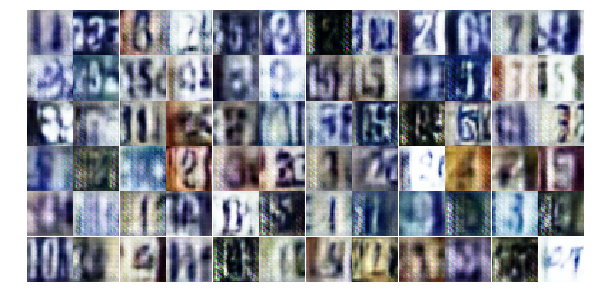

Epoch 8/10... Discriminator Loss: 0.9432... Generator Loss: 0.6768
Epoch 8/10... Discriminator Loss: 1.3177... Generator Loss: 0.4430
Epoch 8/10... Discriminator Loss: 0.4420... Generator Loss: 1.6007
Epoch 8/10... Discriminator Loss: 0.4031... Generator Loss: 2.1334
Epoch 8/10... Discriminator Loss: 1.0045... Generator Loss: 0.5947
Epoch 8/10... Discriminator Loss: 0.3419... Generator Loss: 1.6299
Epoch 8/10... Discriminator Loss: 0.4000... Generator Loss: 1.5262
Epoch 8/10... Discriminator Loss: 0.3497... Generator Loss: 1.8568
Epoch 8/10... Discriminator Loss: 0.5697... Generator Loss: 1.3030
Epoch 8/10... Discriminator Loss: 1.0450... Generator Loss: 0.5988


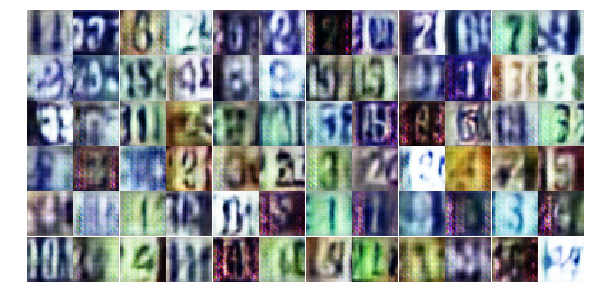

Epoch 8/10... Discriminator Loss: 0.5421... Generator Loss: 4.4005
Epoch 8/10... Discriminator Loss: 1.1423... Generator Loss: 0.6066
Epoch 8/10... Discriminator Loss: 0.2407... Generator Loss: 3.1954
Epoch 8/10... Discriminator Loss: 0.8260... Generator Loss: 0.8061
Epoch 8/10... Discriminator Loss: 0.5387... Generator Loss: 1.4837
Epoch 8/10... Discriminator Loss: 0.4238... Generator Loss: 1.6563
Epoch 8/10... Discriminator Loss: 1.2418... Generator Loss: 2.7544
Epoch 8/10... Discriminator Loss: 0.5925... Generator Loss: 1.1484
Epoch 8/10... Discriminator Loss: 0.7507... Generator Loss: 1.0877
Epoch 8/10... Discriminator Loss: 0.8280... Generator Loss: 0.9867


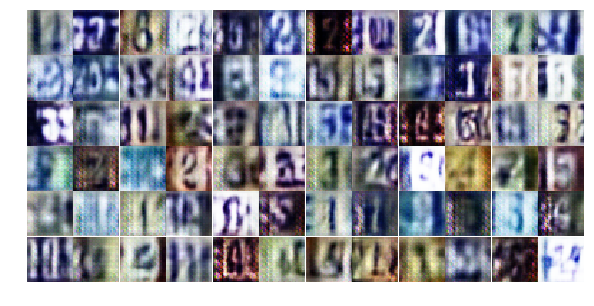

Epoch 8/10... Discriminator Loss: 0.4612... Generator Loss: 1.8570
Epoch 8/10... Discriminator Loss: 0.3529... Generator Loss: 1.7575
Epoch 8/10... Discriminator Loss: 0.3433... Generator Loss: 1.6243
Epoch 8/10... Discriminator Loss: 1.0205... Generator Loss: 0.6100
Epoch 8/10... Discriminator Loss: 0.5754... Generator Loss: 2.1066
Epoch 8/10... Discriminator Loss: 0.7872... Generator Loss: 1.0176
Epoch 8/10... Discriminator Loss: 0.5374... Generator Loss: 1.2039
Epoch 8/10... Discriminator Loss: 0.6751... Generator Loss: 1.7027
Epoch 9/10... Discriminator Loss: 0.8898... Generator Loss: 0.7984
Epoch 9/10... Discriminator Loss: 0.6809... Generator Loss: 0.9966


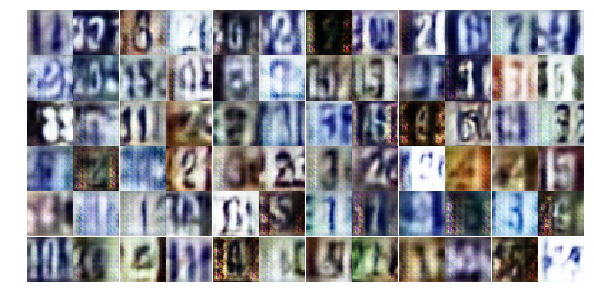

Epoch 9/10... Discriminator Loss: 0.6193... Generator Loss: 1.1425
Epoch 9/10... Discriminator Loss: 0.8725... Generator Loss: 0.9174
Epoch 9/10... Discriminator Loss: 1.0321... Generator Loss: 0.6165
Epoch 9/10... Discriminator Loss: 0.4202... Generator Loss: 1.6615
Epoch 9/10... Discriminator Loss: 0.9570... Generator Loss: 0.7432
Epoch 9/10... Discriminator Loss: 0.6168... Generator Loss: 1.3789
Epoch 9/10... Discriminator Loss: 0.7594... Generator Loss: 2.0898
Epoch 9/10... Discriminator Loss: 0.7520... Generator Loss: 0.8778
Epoch 9/10... Discriminator Loss: 0.7731... Generator Loss: 0.8410
Epoch 9/10... Discriminator Loss: 0.5301... Generator Loss: 1.2781


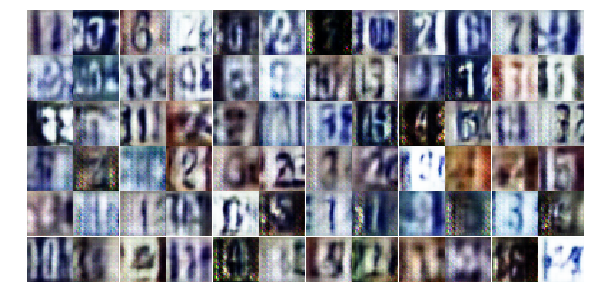

Epoch 9/10... Discriminator Loss: 0.6928... Generator Loss: 0.9875
Epoch 9/10... Discriminator Loss: 0.8951... Generator Loss: 0.9033
Epoch 9/10... Discriminator Loss: 0.7522... Generator Loss: 0.9206
Epoch 9/10... Discriminator Loss: 0.8228... Generator Loss: 0.8617
Epoch 9/10... Discriminator Loss: 0.4401... Generator Loss: 1.4487
Epoch 9/10... Discriminator Loss: 1.3617... Generator Loss: 3.8081
Epoch 9/10... Discriminator Loss: 1.2795... Generator Loss: 0.5134
Epoch 9/10... Discriminator Loss: 0.3266... Generator Loss: 1.7650
Epoch 9/10... Discriminator Loss: 1.1139... Generator Loss: 0.5507
Epoch 9/10... Discriminator Loss: 0.7652... Generator Loss: 1.0141


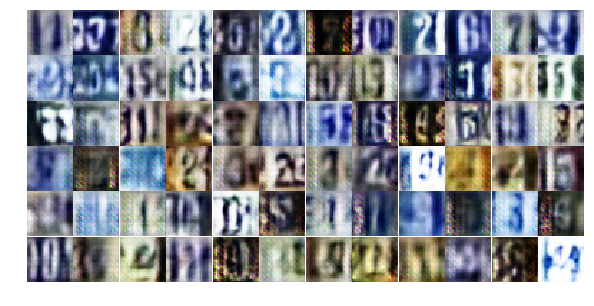

Epoch 9/10... Discriminator Loss: 0.7764... Generator Loss: 1.1984
Epoch 9/10... Discriminator Loss: 0.6589... Generator Loss: 1.2662
Epoch 9/10... Discriminator Loss: 0.7862... Generator Loss: 1.1845
Epoch 9/10... Discriminator Loss: 0.3147... Generator Loss: 1.9865
Epoch 9/10... Discriminator Loss: 1.1526... Generator Loss: 0.5025
Epoch 9/10... Discriminator Loss: 0.5093... Generator Loss: 1.3104
Epoch 9/10... Discriminator Loss: 1.5360... Generator Loss: 0.3421
Epoch 9/10... Discriminator Loss: 0.6045... Generator Loss: 1.2661
Epoch 9/10... Discriminator Loss: 0.4589... Generator Loss: 1.3437
Epoch 9/10... Discriminator Loss: 0.6195... Generator Loss: 1.1031


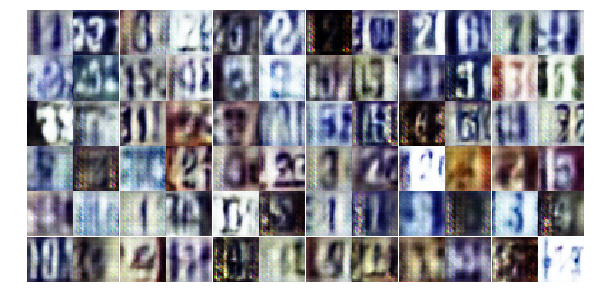

Epoch 9/10... Discriminator Loss: 0.5599... Generator Loss: 1.1799
Epoch 9/10... Discriminator Loss: 0.4148... Generator Loss: 1.6313
Epoch 9/10... Discriminator Loss: 1.0829... Generator Loss: 0.5711
Epoch 9/10... Discriminator Loss: 0.6745... Generator Loss: 1.5468
Epoch 9/10... Discriminator Loss: 0.5198... Generator Loss: 1.3245
Epoch 9/10... Discriminator Loss: 0.7045... Generator Loss: 1.3845
Epoch 9/10... Discriminator Loss: 0.4919... Generator Loss: 1.3925
Epoch 9/10... Discriminator Loss: 0.6384... Generator Loss: 1.0339
Epoch 9/10... Discriminator Loss: 0.6253... Generator Loss: 1.1803
Epoch 9/10... Discriminator Loss: 0.6119... Generator Loss: 1.0410


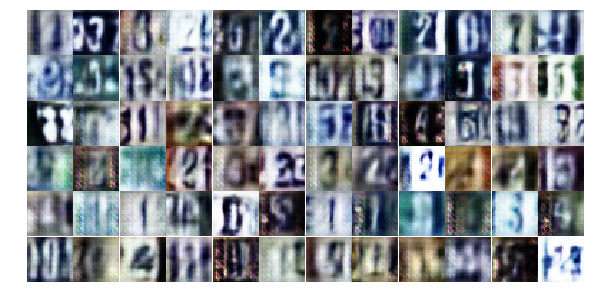

Epoch 9/10... Discriminator Loss: 0.5210... Generator Loss: 1.2170
Epoch 9/10... Discriminator Loss: 0.5581... Generator Loss: 1.5685
Epoch 9/10... Discriminator Loss: 0.5281... Generator Loss: 1.2781
Epoch 9/10... Discriminator Loss: 0.6236... Generator Loss: 1.0372
Epoch 9/10... Discriminator Loss: 0.3833... Generator Loss: 2.2356
Epoch 9/10... Discriminator Loss: 0.4476... Generator Loss: 1.4479
Epoch 9/10... Discriminator Loss: 0.9670... Generator Loss: 0.6226
Epoch 9/10... Discriminator Loss: 0.4106... Generator Loss: 1.7186
Epoch 9/10... Discriminator Loss: 0.8000... Generator Loss: 0.8432
Epoch 9/10... Discriminator Loss: 1.3967... Generator Loss: 2.7717


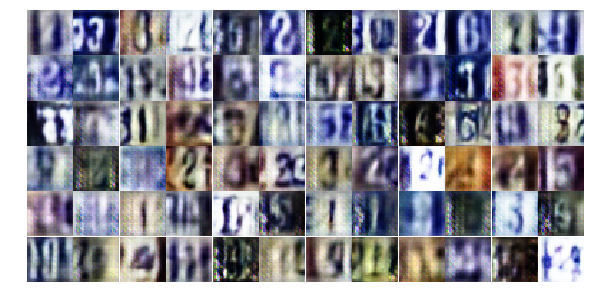

Epoch 9/10... Discriminator Loss: 0.8032... Generator Loss: 1.1334
Epoch 9/10... Discriminator Loss: 0.6719... Generator Loss: 1.2735
Epoch 9/10... Discriminator Loss: 0.6176... Generator Loss: 1.4047
Epoch 9/10... Discriminator Loss: 1.1790... Generator Loss: 0.4817
Epoch 9/10... Discriminator Loss: 0.6302... Generator Loss: 1.4547
Epoch 10/10... Discriminator Loss: 0.6851... Generator Loss: 1.1525
Epoch 10/10... Discriminator Loss: 0.5511... Generator Loss: 1.3720
Epoch 10/10... Discriminator Loss: 0.5330... Generator Loss: 1.3522
Epoch 10/10... Discriminator Loss: 0.9603... Generator Loss: 0.7466
Epoch 10/10... Discriminator Loss: 1.2953... Generator Loss: 0.4234


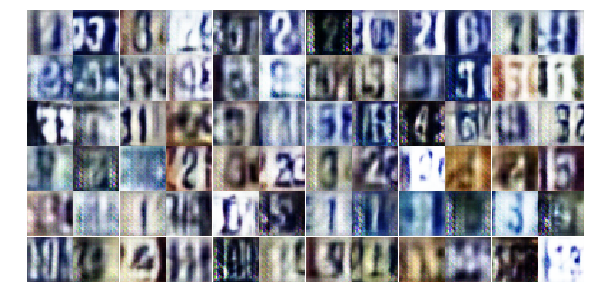

Epoch 10/10... Discriminator Loss: 0.6668... Generator Loss: 1.0950
Epoch 10/10... Discriminator Loss: 0.7695... Generator Loss: 2.5971
Epoch 10/10... Discriminator Loss: 0.7666... Generator Loss: 1.0164
Epoch 10/10... Discriminator Loss: 0.7970... Generator Loss: 1.0266
Epoch 10/10... Discriminator Loss: 0.6967... Generator Loss: 1.0300
Epoch 10/10... Discriminator Loss: 0.8137... Generator Loss: 1.1026
Epoch 10/10... Discriminator Loss: 0.4741... Generator Loss: 1.2829
Epoch 10/10... Discriminator Loss: 1.1564... Generator Loss: 0.5321
Epoch 10/10... Discriminator Loss: 0.7984... Generator Loss: 0.8481
Epoch 10/10... Discriminator Loss: 0.6676... Generator Loss: 1.4622


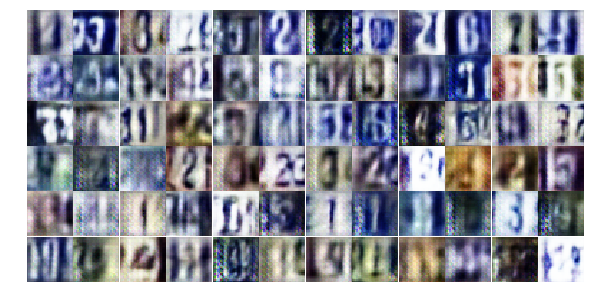

Epoch 10/10... Discriminator Loss: 0.5617... Generator Loss: 1.4968
Epoch 10/10... Discriminator Loss: 0.7994... Generator Loss: 0.8045
Epoch 10/10... Discriminator Loss: 0.6719... Generator Loss: 1.0069
Epoch 10/10... Discriminator Loss: 0.9925... Generator Loss: 0.7057
Epoch 10/10... Discriminator Loss: 0.4446... Generator Loss: 1.7639
Epoch 10/10... Discriminator Loss: 0.3112... Generator Loss: 1.8999
Epoch 10/10... Discriminator Loss: 1.1860... Generator Loss: 0.5358
Epoch 10/10... Discriminator Loss: 0.5069... Generator Loss: 1.6342
Epoch 10/10... Discriminator Loss: 0.6150... Generator Loss: 1.2127
Epoch 10/10... Discriminator Loss: 0.6638... Generator Loss: 2.8940


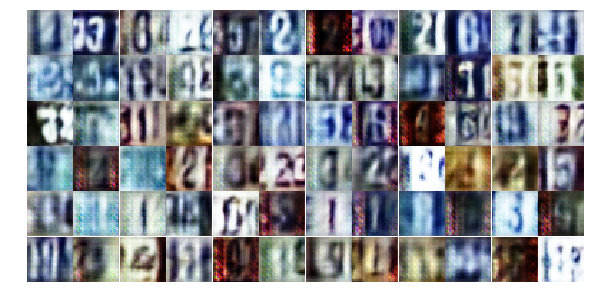

Epoch 10/10... Discriminator Loss: 0.6859... Generator Loss: 0.9373
Epoch 10/10... Discriminator Loss: 0.6676... Generator Loss: 1.2655
Epoch 10/10... Discriminator Loss: 0.4355... Generator Loss: 1.5458
Epoch 10/10... Discriminator Loss: 0.6127... Generator Loss: 1.9050
Epoch 10/10... Discriminator Loss: 1.8937... Generator Loss: 0.2368
Epoch 10/10... Discriminator Loss: 1.1472... Generator Loss: 0.5627
Epoch 10/10... Discriminator Loss: 0.4859... Generator Loss: 1.2700
Epoch 10/10... Discriminator Loss: 0.4001... Generator Loss: 1.5394
Epoch 10/10... Discriminator Loss: 0.6508... Generator Loss: 1.0553
Epoch 10/10... Discriminator Loss: 0.8978... Generator Loss: 0.7294


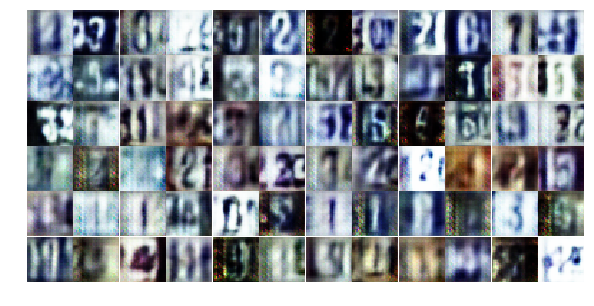

Epoch 10/10... Discriminator Loss: 0.7630... Generator Loss: 2.4542
Epoch 10/10... Discriminator Loss: 0.7655... Generator Loss: 0.9381
Epoch 10/10... Discriminator Loss: 0.5222... Generator Loss: 1.5286
Epoch 10/10... Discriminator Loss: 0.3145... Generator Loss: 2.3483
Epoch 10/10... Discriminator Loss: 0.7254... Generator Loss: 1.0715
Epoch 10/10... Discriminator Loss: 1.1659... Generator Loss: 3.0313
Epoch 10/10... Discriminator Loss: 1.6556... Generator Loss: 0.3526
Epoch 10/10... Discriminator Loss: 0.9794... Generator Loss: 0.7008
Epoch 10/10... Discriminator Loss: 0.5747... Generator Loss: 1.0618
Epoch 10/10... Discriminator Loss: 0.6025... Generator Loss: 1.8328


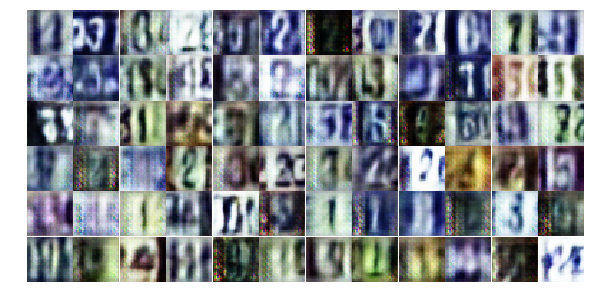

Epoch 10/10... Discriminator Loss: 0.8164... Generator Loss: 0.8174
Epoch 10/10... Discriminator Loss: 0.5120... Generator Loss: 1.3808
Epoch 10/10... Discriminator Loss: 1.0108... Generator Loss: 0.6014
Epoch 10/10... Discriminator Loss: 1.5077... Generator Loss: 0.3354
Epoch 10/10... Discriminator Loss: 0.4922... Generator Loss: 1.5852
Epoch 10/10... Discriminator Loss: 0.6543... Generator Loss: 1.0806
Epoch 10/10... Discriminator Loss: 0.4882... Generator Loss: 1.3793
Epoch 10/10... Discriminator Loss: 0.4678... Generator Loss: 1.6042
Epoch 10/10... Discriminator Loss: 0.9059... Generator Loss: 2.0675
Epoch 10/10... Discriminator Loss: 0.5476... Generator Loss: 1.5244


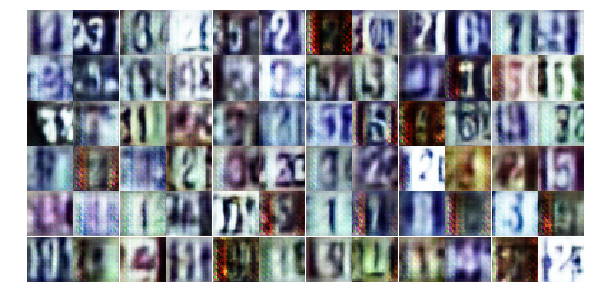

Epoch 10/10... Discriminator Loss: 0.7909... Generator Loss: 1.3845
Epoch 10/10... Discriminator Loss: 1.0003... Generator Loss: 0.6143
Epoch 10/10... Discriminator Loss: 0.3776... Generator Loss: 1.9250


In [32]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

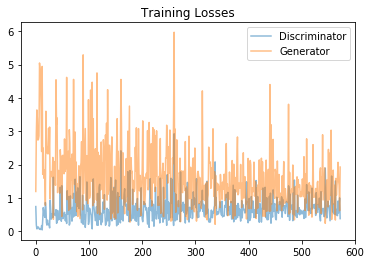

In [34]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

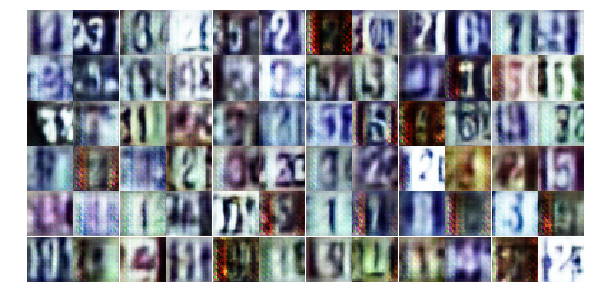

In [35]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))